In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, when, lit

# Initializing Spark session
spark = SparkSession.builder \
    .appName("FP") \
    .getOrCreate()

# Loading the data into df1
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/jgadiraj@gmu.edu/AIT614FinalData.csv")


In [0]:
df1.display()

Year,Mo,Dy,Hr,Mn,Sec,Tsunami Event Validity,Tsunami Cause Code,Tsu Src,Earthquake Magnitude,Vol,More Info,Doubtful Runup,Country,Area,Location Name,Latitude,Longitude,Distance From Source (km),Initial Wave Arrival Dy,Initial Wave Arrival Hr,Initial Wave Arrival Min,Travel Hours,Travel Minutes,Max Wave Arrival Day,Max Wave Arrival Hr,Max Wave Arrival Min,Max Water Height (m),Max Inundation Distance (m),Measurement Type,Period,First Motion,Deaths,Death Description,Missing,Missing Description,Injuries,Injuries Description,Damage $Mil,Damage Description,Houses Destroyed,Houses Destroyed Description,Houses Damaged,Houses Damaged Description
1900,5,16,20,12,null,3,1,5897,6.9,null,null,n,MEXICO,JALISCO,PUERTO VALLARTA,20.622,-105.232,72.99902537,null,null,null,null,null,null,null,null,null,null,1,null,null,null,1,null,null,null,null,null,null,null,null,null,null
1900,5,16,20,12,null,3,1,5897,6.9,null,null,n,MEXICO,null,"EL ZAPOTILLO, TEPIC",21.52,-105.25,170.2869037,null,null,null,null,null,null,null,null,null,null,1,null,null,null,1,null,null,null,null,null,null,null,null,null,null
1900,9,10,21,30,null,4,1,1272,6.8,null,null,n,PAPUA NEW GUINEA,EAST NEW BRITAIN,"RABAUL, NEW BRITAIN",-4.22,152.18,31.48467026,null,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1900,9,10,21,30,null,4,1,1272,6.8,null,null,n,PAPUA NEW GUINEA,EAST NEW BRITAIN,"RALUM, NEW BRITAIN",-4.325,152.24,44.73949179,null,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1900,9,10,21,30,null,4,1,1272,6.8,null,null,n,PAPUA NEW GUINEA,EAST NEW BRITAIN,"REPERSTSHOH (KOKOPO?), NEW BRITAIN",null,null,null,null,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1900,9,17,21,45,null,3,1,1274,7.1,null,null,n,PAPUA NEW GUINEA,EAST NEW BRITAIN,"RABAUL (BLANCHE BAY), NEW BRITAIN",-4.22,152.18,471.7677561,null,null,null,null,null,null,null,null,3,null,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1900,10,7,21,4,null,3,1,1275,6.9,null,null,n,INDONESIA,PAPUA,NAPAN,-3.05,135.75,483.756565,null,null,null,null,null,null,null,null,null,null,1,null,null,5,1,null,null,null,null,null,1,1,1,null,null
1900,10,7,21,4,null,3,1,1275,6.9,null,null,n,PALAU,null,TOBI ISLAND,3.00611,131.123889,1255.068497,null,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,null,null,null,null,1,null,null,null,null
1900,10,7,21,4,null,3,1,1275,6.9,null,null,n,INDONESIA,WEST PAPUA,WANDAMMEN BAY,-2.85,134.5,624.2493233,null,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1900,10,7,21,4,null,3,1,1275,6.9,null,null,n,INDONESIA,WEST PAPUA,WINDESSI,-2.4167,134.2167,666.1876099,null,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col


spark = SparkSession.builder \
    .appName("TsunamiPrediction") \
    .getOrCreate()

# Loading data into df1
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/jgadiraj@gmu.edu/AIT614FinalData.csv")


df_cleaned = df1.filter((col("Tsunami Cause Code").isNotNull()) & (col("Tsunami Cause Code") != "0"))

numerical_cols = ['Earthquake Magnitude', 'Max Water Height (m)', 'Max Inundation Distance (m)', 'Latitude', 'Longitude']
for col_name in numerical_cols:
    df_cleaned = df_cleaned.withColumn(col_name, col(col_name).cast("double"))


non_numeric_count = df_cleaned.filter(~col("Tsunami Cause Code").cast("double").isNotNull()).count()
if non_numeric_count > 0:
    raise ValueError("Found non-numeric values in Tsunami Cause Code column.")


df_cleaned = df_cleaned.withColumn("Tsunami Cause Code", col("Tsunami Cause Code").cast("double"))

for col_name in numerical_cols:
    df_cleaned = df_cleaned.filter(col(col_name).isNotNull())

df_cleaned.printSchema()
df_cleaned.show(5)

# training and testing sets
train_data, test_data = df_cleaned.randomSplit([0.8, 0.2], seed=42)


selected_features = ['Earthquake Magnitude', 'Max Water Height (m)', 'Max Inundation Distance (m)', 'Latitude', 'Longitude']


from pyspark.ml.feature import VectorAssembler

assembler = VectorAssembler(inputCols=selected_features, outputCol="features")
train_features = assembler.transform(train_data)
test_features = assembler.transform(test_data)


# Machine learning models
from pyspark.ml.classification import RandomForestClassifier, DecisionTreeClassifier, LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Defining and training the models
rf = RandomForestClassifier(labelCol="Tsunami Cause Code", featuresCol="features")
dt = DecisionTreeClassifier(labelCol="Tsunami Cause Code", featuresCol="features")
lr = LogisticRegression(labelCol="Tsunami Cause Code", featuresCol="features")


rf_model = rf.fit(train_features)
dt_model = dt.fit(train_features)
lr_model = lr.fit(train_features)

#  predictions
rf_predictions = rf_model.transform(test_features)
dt_predictions = dt_model.transform(test_features)
lr_predictions = lr_model.transform(test_features)

# Evaluate models
evaluator = MulticlassClassificationEvaluator(labelCol="Tsunami Cause Code", metricName="accuracy")

rf_accuracy = evaluator.evaluate(rf_predictions)
dt_accuracy = evaluator.evaluate(dt_predictions)
lr_accuracy = evaluator.evaluate(lr_predictions)

print("Random Forest Accuracy:", rf_accuracy)
print("Decision Tree Accuracy:", dt_accuracy)
print("Logistic Regression Accuracy:", lr_accuracy)


root
 |-- Year: string (nullable = true)
 |-- Mo: string (nullable = true)
 |-- Dy: string (nullable = true)
 |-- Hr: string (nullable = true)
 |-- Mn: string (nullable = true)
 |-- Sec: string (nullable = true)
 |-- Tsunami Event Validity: string (nullable = true)
 |-- Tsunami Cause Code: double (nullable = true)
 |-- Tsu Src: string (nullable = true)
 |-- Earthquake Magnitude: double (nullable = true)
 |-- Vol: string (nullable = true)
 |-- More Info: string (nullable = true)
 |-- Doubtful Runup: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- Area: string (nullable = true)
 |-- Location Name: string (nullable = true)
 |-- Latitude: double (nullable = true)
 |-- Longitude: double (nullable = true)
 |-- Distance From Source (km): string (nullable = true)
 |-- Initial Wave Arrival Dy: string (nullable = true)
 |-- Initial Wave Arrival Hr: string (nullable = true)
 |-- Initial Wave Arrival Min: string (nullable = true)
 |-- Travel Hours: string (nullable = true)
 |-

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Random Forest Accuracy: 0.9934718100890207
Decision Tree Accuracy: 0.9928783382789318
Logistic Regression Accuracy: 0.9756676557863502


Random Forest Accuracy: 0.9934718100890207
Decision Tree Accuracy: 0.9928783382789318
Logistic Regression Accuracy: 0.9756676557863502


/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


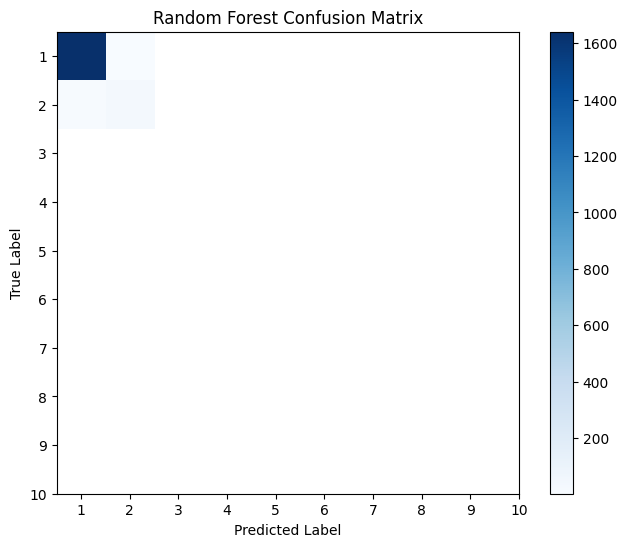

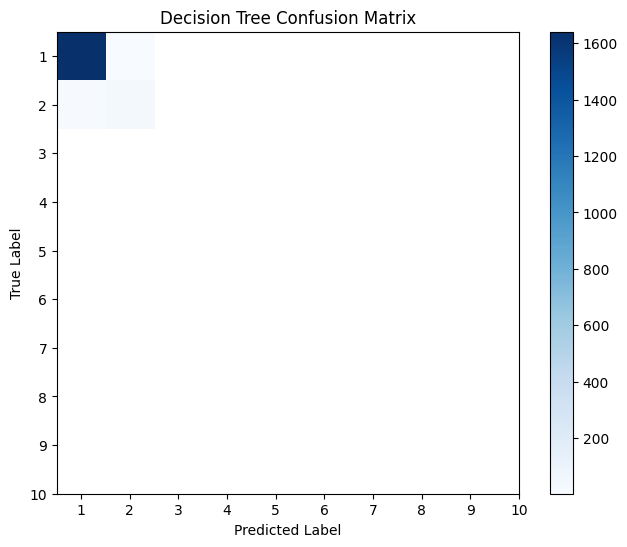

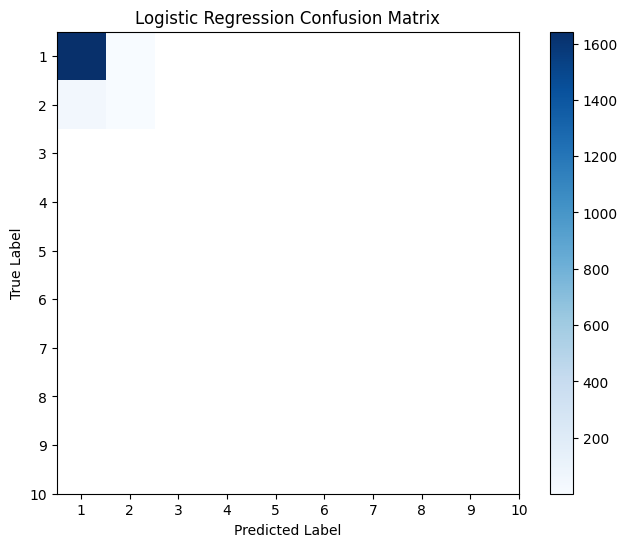

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics
import matplotlib.pyplot as plt
import numpy as np


# Random Forest model
rf_evaluator = MulticlassClassificationEvaluator(labelCol="Tsunami Cause Code", predictionCol="prediction", metricName="accuracy")
rf_accuracy = rf_evaluator.evaluate(rf_predictions)

# Decision Tree model
dt_evaluator = MulticlassClassificationEvaluator(labelCol="Tsunami Cause Code", predictionCol="prediction", metricName="accuracy")
dt_accuracy = dt_evaluator.evaluate(dt_predictions)

# Logistic Regression model
lr_evaluator = MulticlassClassificationEvaluator(labelCol="Tsunami Cause Code", predictionCol="prediction", metricName="accuracy")
lr_accuracy = lr_evaluator.evaluate(lr_predictions)

print("Random Forest Accuracy:", rf_accuracy)
print("Decision Tree Accuracy:", dt_accuracy)
print("Logistic Regression Accuracy:", lr_accuracy)

#  RDD
rf_predictionAndLabels = rf_predictions.select("prediction", "Tsunami Cause Code").rdd
dt_predictionAndLabels = dt_predictions.select("prediction", "Tsunami Cause Code").rdd
lr_predictionAndLabels = lr_predictions.select("prediction", "Tsunami Cause Code").rdd

# Creating MulticlassMetrics 
rf_metrics = MulticlassMetrics(rf_predictionAndLabels)
dt_metrics = MulticlassMetrics(dt_predictionAndLabels)
lr_metrics = MulticlassMetrics(lr_predictionAndLabels)

# confusion matrix of Random Forest plot 
rf_cm = rf_metrics.confusionMatrix().toArray()
plt.figure(figsize=(8, 6))
plt.imshow(rf_cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Random Forest Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(10)
plt.xticks(tick_marks, range(1, 11))
plt.yticks(tick_marks, range(1, 11))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# confusion matrix of Decision Tree plot
dt_cm = dt_metrics.confusionMatrix().toArray()
plt.figure(figsize=(8, 6))
plt.imshow(dt_cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Decision Tree Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(10)
plt.xticks(tick_marks, range(1, 11))
plt.yticks(tick_marks, range(1, 11))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# confusion matrix of Logistic Regression plot 
lr_cm = lr_metrics.confusionMatrix().toArray()
plt.figure(figsize=(8, 6))
plt.imshow(lr_cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Logistic Regression Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(10)
plt.xticks(tick_marks, range(1, 11))
plt.yticks(tick_marks, range(1, 11))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


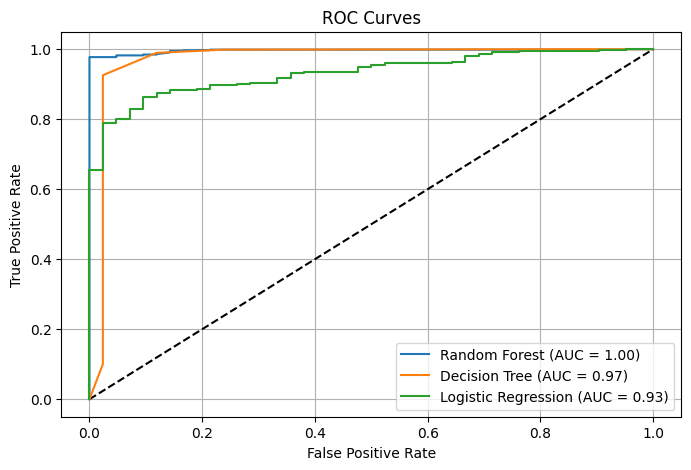

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


pos_label = 1.0

# Extracting the probabilities and labels for each model
rf_probs = np.array(rf_predictions.select('probability').rdd.map(lambda x: x['probability'][1]).collect())
rf_labels = np.array(rf_predictions.select('Tsunami Cause Code').rdd.map(lambda x: 1.0 if x['Tsunami Cause Code'] == pos_label else 0.0).collect())

dt_probs = np.array(dt_predictions.select('probability').rdd.map(lambda x: x['probability'][1]).collect())
dt_labels = np.array(dt_predictions.select('Tsunami Cause Code').rdd.map(lambda x: 1.0 if x['Tsunami Cause Code'] == pos_label else 0.0).collect())

lr_probs = np.array(lr_predictions.select('probability').rdd.map(lambda x: x['probability'][1]).collect())
lr_labels = np.array(lr_predictions.select('Tsunami Cause Code').rdd.map(lambda x: 1.0 if x['Tsunami Cause Code'] == pos_label else 0.0).collect())

#  ROC curve and ROC area for each class
rf_fpr, rf_tpr, _ = roc_curve(rf_labels, rf_probs)
rf_roc_auc = auc(rf_fpr, rf_tpr)

dt_fpr, dt_tpr, _ = roc_curve(dt_labels, dt_probs)
dt_roc_auc = auc(dt_fpr, dt_tpr)

lr_fpr, lr_tpr, _ = roc_curve(lr_labels, lr_probs)
lr_roc_auc = auc(lr_fpr, lr_tpr)

# Plotting the ROC curves
plt.figure(figsize=(8, 5))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(rf_fpr, rf_tpr, label='Random Forest (AUC = {:.2f})'.format(rf_roc_auc))
plt.plot(dt_fpr, dt_tpr, label='Decision Tree (AUC = {:.2f})'.format(dt_roc_auc))
plt.plot(lr_fpr, lr_tpr, label='Logistic Regression (AUC = {:.2f})'.format(lr_roc_auc))

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()
